In [42]:
from PINNs import *
import torch
import numpy as np
import matplotlib.pyplot as plt
from smt.sampling_methods import LHS
dtype=torch.float64
setup_seed(2)
Ts = 0
Te = 0.04
Xs = 0
Xe = 1
Nx = 100
Nt = 100
dt = 0.002
dx = 0.0002

crhoL = 3.857143
cuL = 2.629369
cpL = 10.333333


crhoR = 1#+0.2*np.sin(10)
cuR = 0
cpR = 1
crhoL = 1.0
cuL = 0.803219*2
cpL = 1.0

crhoR = 0.259259*(1+0.6*np.sin(10))
cuR = 0
cpR = 0.096774

#Te = 0.2946
Te = 0.03

setup_seed(10)
def train(epoch):
    def closure():
        optimizer.zero_grad()                                                     
        loss_pde = model.loss_pde(x_int)                                    
        loss_ic = model.loss_ic(x_ic, rho_ic,u_ic,p_ic)   
        loss_bc = model.loss_ic(x_bc, rho_bc,u_bc,p_bc)   
        
        loss_rh = model.loss_rh(xrh,xrhL) # RH relation
        loss_con = model.loss_con(x_en,x_ic,crhoL,cuL,cpL,crhoR,cuR,cpR,Te-Ts) #Conservation laws
       # loss = loss_pde + 10*(loss_ic)# + 10*(loss_rh) +10*loss_con  
        loss =  loss_pde+ 10*(loss_ic+loss_bc) + 10*(loss_rh) +10*loss_con  
        print(f'epoch {epoch} loss_pde:{loss_pde:.8f}, loss_ic:{loss_ic:.8f}, loss_rh:{loss_rh:.8f},loss_con:{loss_con:.8f}')
        loss.backward()
        return loss
    loss = optimizer.step(closure)
    return loss

#x_ic,x_bc,x_int =  Mesh_Data(Nx,Nt,Ts,Te,Xs,Xe)

xlimits = np.array([[0.,0],[0, Xe/2]])  #interal
sampling = LHS(xlimits=xlimits)
x_ic= sampling(100)

xlimits = np.array([[0.,Te],[0, 0]])  #interal
sampling = LHS(xlimits=xlimits)
x_bc= sampling(100)
#xlimits = np.array([[0.,Te],[Xe, Xe]])  #interal
#sampling = LHS(xlimits=xlimits)
#x_bcR= sampling(100)
#x_bc = np.vstack((x_bcL,x_bcR))

rho_ic, u_ic, p_ic= IC_ShuOsher(x_ic)                    
rho_bc, u_bc, p_bc= IC_Riemann_1D(x_bc,crhoL,cuL,cpL,crhoR,cuR,cpR)                    
xlimits = np.array([[0.,Te],[0, Xe/2]])  #interal
sampling = LHS(xlimits=xlimits)
x_int= sampling(8000)

xrh,xrhL,xrhR,xrhP,xrhPL,xrhPR = Pertur_1D(x_int,Te,dt,dx)

x_en = Move_Time_1D(x_ic,Te)

x_ic = torch.tensor(x_ic,dtype=dtype).to(cuda)
x_bc = torch.tensor(x_bc,dtype=dtype).to(cuda)
x_int = torch.tensor(x_int,requires_grad=True, dtype=dtype).to(cuda)
x_en = torch.tensor(x_en,  dtype=dtype).to(cuda)
xrh = torch.tensor(xrh,  dtype=dtype).to(cuda)
xrhL = torch.tensor(xrhL,  dtype=dtype).to(cuda)

rho_ic = torch.tensor(rho_ic, dtype=dtype).to(cuda)
u_ic = torch.tensor(u_ic, dtype=dtype).to(cuda)
p_ic = torch.tensor(p_ic, dtype=dtype).to(cuda)

rho_bc = torch.tensor(rho_bc, dtype=dtype).to(cuda)
u_bc = torch.tensor(u_bc, dtype=dtype).to(cuda)
p_bc = torch.tensor(p_bc, dtype=dtype).to(cuda)

In [46]:
model = PINNs_WE_Euler_1D(Nl=6,Nn=60).to(cuda).double()
print('Start training...')
epoch = 0
epochi = epoch
lr = 0.0001                                                           # Learning rate
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
epochs = 100000
loss_history=[]
tic = time.time()
for epoch in range(1+epochi, epochs+epochi):
    loss = train(epoch)
    print(f'loss_tot:{loss:.8f}')
    loss_history.append(to_numpy(loss))
    if loss < 0.05:
        break
toc = time.time()
print(f'Total training time: {toc - tic}')



Start training...
epoch 1 loss_pde:0.00057290, loss_ic:1.97598244, loss_rh:0.00000000,loss_con:0.06621869
loss_tot:67.17958365
epoch 2 loss_pde:0.00049958, loss_ic:1.96383737, loss_rh:0.00000000,loss_con:0.06624601
loss_tot:66.78250602
epoch 3 loss_pde:0.00042977, loss_ic:1.95179457, loss_rh:0.00000000,loss_con:0.06627405
loss_tot:66.38763406
epoch 4 loss_pde:0.00036488, loss_ic:1.93985286, loss_rh:0.00000000,loss_con:0.06630259
loss_tot:65.99491040
epoch 5 loss_pde:0.00030542, loss_ic:1.92800751, loss_rh:0.00000000,loss_con:0.06633172
loss_tot:65.60416564
epoch 6 loss_pde:0.00025204, loss_ic:1.91625232, loss_rh:0.00000000,loss_con:0.06636151
loss_tot:65.21519486
epoch 7 loss_pde:0.00020571, loss_ic:1.90458064, loss_rh:0.00000000,loss_con:0.06639194
loss_tot:64.82778985
epoch 8 loss_pde:0.00016749, loss_ic:1.89298539, loss_rh:0.00000000,loss_con:0.06642297
loss_tot:64.44173561
epoch 9 loss_pde:0.00013842, loss_ic:1.88145914, loss_rh:0.00000000,loss_con:0.06645452
loss_tot:64.05680143
e

In [17]:
Unit_var(crhoL,cuL,cpL,crhoR,cuR,cpR,Te)

(1.0,
 0.803219,
 1.0,
 0.17463357848715977,
 -0.803219,
 0.096774,
 0.2946,
 1.0,
 1.0,
 1.0)

In [48]:
optimizer = torch.optim.LBFGS(model.parameters(),lr=0.1,max_iter=20)

epochi = 0

model = model.to(cuda)
epochs = 5000
tic = time.time()
for epoch in range(epochi, epochs+epochi):
    loss = train(epoch)
  #  print(f'loss_tot:{loss:.8f}')
  #  loss_history.append(to_numpy(loss))
  #  if loss < 0.005:
   #     break
toc = time.time()

print(f'Total training time: {toc - tic}')

epoch 0 loss_pde:0.25814069, loss_ic:0.24983183, loss_rh:0.00008564,loss_con:0.00122854
epoch 0 loss_pde:0.27311629, loss_ic:0.24797314, loss_rh:0.00008457,loss_con:0.00120987
epoch 0 loss_pde:0.27301863, loss_ic:0.24787130, loss_rh:0.00008440,loss_con:0.00121160
epoch 0 loss_pde:0.27334935, loss_ic:0.24778763, loss_rh:0.00008427,loss_con:0.00121245
epoch 0 loss_pde:0.27360920, loss_ic:0.24771812, loss_rh:0.00008415,loss_con:0.00121329
epoch 0 loss_pde:0.27386614, loss_ic:0.24765509, loss_rh:0.00008404,loss_con:0.00121410
epoch 0 loss_pde:0.27411331, loss_ic:0.24759799, loss_rh:0.00008393,loss_con:0.00121488
epoch 0 loss_pde:0.27435113, loss_ic:0.24754583, loss_rh:0.00008382,loss_con:0.00121564
epoch 0 loss_pde:0.27458004, loss_ic:0.24749782, loss_rh:0.00008372,loss_con:0.00121637
epoch 0 loss_pde:0.27480079, loss_ic:0.24745326, loss_rh:0.00008361,loss_con:0.00121708
epoch 0 loss_pde:0.27501433, loss_ic:0.24741154, loss_rh:0.00008351,loss_con:0.00121777
epoch 0 loss_pde:0.27522174, los

epoch 0 loss_pde:0.27620941, loss_ic:0.24719417, loss_rh:0.00008291,loss_con:0.00122171
epoch 0 loss_pde:0.27640606, loss_ic:0.24715973, loss_rh:0.00008280,loss_con:0.00122236
epoch 0 loss_pde:0.27660542, loss_ic:0.24712489, loss_rh:0.00008269,loss_con:0.00122301
epoch 0 loss_pde:0.27680873, loss_ic:0.24708933, loss_rh:0.00008257,loss_con:0.00122367
epoch 1 loss_pde:0.27701719, loss_ic:0.24705277, loss_rh:0.00008245,loss_con:0.00122433
epoch 1 loss_pde:0.27723186, loss_ic:0.24701492, loss_rh:0.00008232,loss_con:0.00122500
epoch 1 loss_pde:0.27745371, loss_ic:0.24697553, loss_rh:0.00008219,loss_con:0.00122568
epoch 1 loss_pde:0.27768350, loss_ic:0.24693438, loss_rh:0.00008205,loss_con:0.00122637
epoch 1 loss_pde:0.27789666, loss_ic:0.24689128, loss_rh:0.00008190,loss_con:0.00122705
epoch 1 loss_pde:0.27824902, loss_ic:0.24682886, loss_rh:0.00008171,loss_con:0.00122788
epoch 1 loss_pde:0.27864482, loss_ic:0.24676130, loss_rh:0.00008152,loss_con:0.00122874
epoch 1 loss_pde:0.27904044, los

KeyboardInterrupt: 

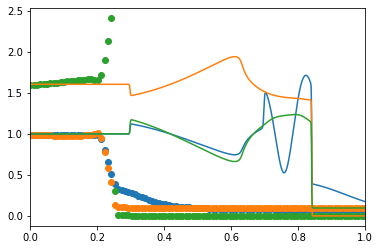

In [41]:
x = np.linspace(0.0, 1.0, 100)                                   
t = np.linspace(Te, Te,1)                                     
t_grid, x_grid = np.meshgrid(t, x)                               
T = t_grid.flatten()[:, None]                                    
X = x_grid.flatten()[:, None]                                    
x_test = np.hstack((T, X))                                       
x_test = torch.tensor(x_test, dtype=dtype).to(cpu)
u_pred = to_numpy(model(x_test))

import matplotlib.pyplot as plt
fig, ax = plt.subplots()
ax.scatter(x[:],u_pred[:,0])
ax.scatter(x[:],u_pred[:,1])
ax.scatter(x[:],u_pred[:,2])
ax.plot(Exact[:,0]*10,Exact[:,1])
ax.plot(Exact[:,0]*10,Exact[:,2])
ax.plot(Exact[:,0]*10,Exact[:,3])
ax.set_xlim(0.0, 1.0)
#ax.set_ylim(0.2, 1.2)
plt.show()

In [8]:
Exact = np.loadtxt('shuosherexact.dat')
Exact[:,0]

array([0.00000000e+00, 9.99000999e-05, 1.99800200e-04, ...,
       9.98001998e-02, 9.99000999e-02, 1.00000000e-01])

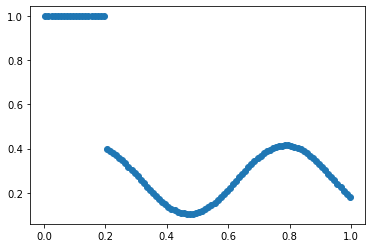

In [34]:
xlimits = np.array([[0.,0],[0, Xe]])  #interal
sampling = LHS(xlimits=xlimits)
x_ic= sampling(100)

rho_ic, u_ic, p_ic= IC_ShuOsher(x_ic)                    

fig, ax = plt.subplots()
ax.scatter(x_ic[:,1],rho_ic)